In this Python script we have written code for anime-style image transformation using pre-trained ONNX models based on the AnimeGAN architecture. It first downloads and installs three AnimeGANv2 models (Hayao, Shinkai, and Paprika styles) along with necessary dependencies like OpenCV, NumPy, and ONNX Runtime. The script includes functions for loading models, processing images (resizing and normalizing), converting real-world images to anime style using the loaded models, and displaying the original and transformed images side by side for comparison.

#Installations and Imports

In [ ]:
# Model nstallations
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=17XRNQgQoUAnu6SM5VgBuhqSBO4UAVNI1' -O AnimeGANv2_Hayao.onnx
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=10rQfe4obW0dkNtsQuWg-szC4diBzYFXK' -O AnimeGANv2_Shinkai.onnx
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1X3Glf69Ter_n2Tj6p81VpGKx7U4Dq-tI' -O AnimeGANv2_Paprika.onnx



--2023-11-18 07:17:47--  https://docs.google.com/uc?export=download&id=17XRNQgQoUAnu6SM5VgBuhqSBO4UAVNI1
Resolving docs.google.com (docs.google.com)... 172.253.117.101, 172.253.117.139, 172.253.117.138, ...
Connecting to docs.google.com (docs.google.com)|172.253.117.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0o-70-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/57hoto3dpchsgqvrf3kdp1m6r602f797/1700291850000/00710070147634057709/*/17XRNQgQoUAnu6SM5VgBuhqSBO4UAVNI1?e=download&uuid=98909fb0-1410-410d-b0eb-3d4f59741fca [following]
--2023-11-18 07:17:48--  https://doc-0o-70-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/57hoto3dpchsgqvrf3kdp1m6r602f797/1700291850000/00710070147634057709/*/17XRNQgQoUAnu6SM5VgBuhqSBO4UAVNI1?e=download&uuid=98909fb0-1410-410d-b0eb-3d4f59741fca
Resolving doc-0o-70-docs.googleusercontent.com (doc-0o-70-docs.googleusercontent.com)... 173.194.202.132, 2607:

In [ ]:
#Installing dependencies
!pip -qq install opencv-python
!pip -qq install numpy
!pip -qq install onnxruntime

In [ ]:
# Imports
import os
import cv2
import numpy as np
import onnxruntime as ort
from PIL import Image
from IPython.display import display
from tqdm.notebook import tqdm

#Preprocessing Functions

In [ ]:
## Functions

#Loads for eaching model
def load_model(model_name):
    model_path = f'./{model_name}.onnx'
    return ort.InferenceSession(model_path, providers=['CPUExecutionProvider'])

# Resize image to a multiple of 32 and normalize for model input
def process_image(img, x32=True):
    h, w = img.shape[:2]
    if x32:  # resize image to multiple of 32s
        def to_32s(x):
            return 256 if x < 256 else x - x % 32
        img = cv2.resize(img, (to_32s(w), to_32s(h)))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32) / 127.5 - 1.0
    return img

# Convert processed image to anime style using the model session
def convert_anime(img, model_session):
    img = np.expand_dims(img, axis=0)
    x = model_session.get_inputs()[0].name
    y = model_session.get_outputs()[0].name
    fake_img = model_session.run(None, {x: img})[0]
    images = (np.squeeze(fake_img) + 1.) / 2 * 255
    images = np.clip(images, 0, 255).astype(np.uint8)
    return cv2.cvtColor(images, cv2.COLOR_RGB2BGR)

# Display original and anime-style images side by side
def show_images(real, anime, size=(256, 256)):
    real_img = cv2.resize(real, size)
    anime_img = cv2.resize(anime, size)
    combined = np.hstack((real_img, anime_img))
    display(Image.fromarray(combined))


# Process and display images from a directory using the anime conversion model
def process_and_display_images(image_dir, model_session, model_name):
    print(f"Results for {model_name}")
    images = os.listdir(image_dir)[:10]  # Select first 10 images
    for image_name in tqdm(images):
        image_path = os.path.join(image_dir, image_name)
        real_image = cv2.imread(image_path)
        processed_image = process_image(real_image)
        anime_image = convert_anime(processed_image, model_session)
        show_images(real_image, anime_image)

#Load Models

In [ ]:
# Load each model
models = {
    'AnimeGANv2_Hayao': load_model('AnimeGANv2_Hayao'),
    'AnimeGANv2_Paprika': load_model('AnimeGANv2_Paprika'),
    'AnimeGANv2_Shinkai': load_model('AnimeGANv2_Shinkai')
}

# Directories for datasets
image_dir_animegan = './Dataset_AnimeGAN/test/real'
image_dir_selfie2anime = './Dataset_Selfie2Anime/selfie2anime/testA'

#Test on Sample Uploaded Image

Saving image_6487327 (1).JPG to image_6487327 (1).JPG
Results using AnimeGANv2_Hayao


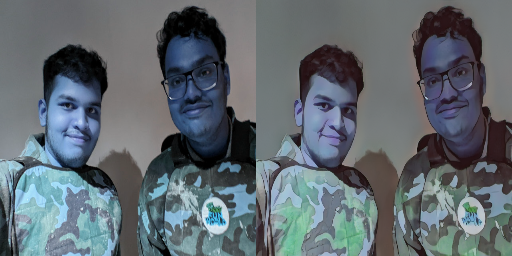

Results using AnimeGANv2_Paprika


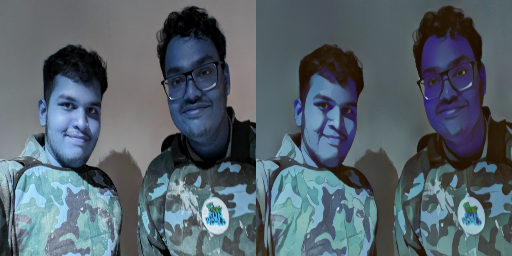

Results using AnimeGANv2_Shinkai


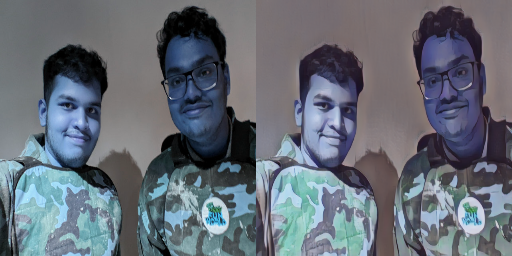

In [ ]:
# Code for uploading and processing an image with all three models

from google.colab import files
from io import BytesIO

def upload_image():
    uploaded = files.upload()
    for fn in uploaded.keys():
        img = cv2.imdecode(np.frombuffer(uploaded[fn], np.uint8), cv2.IMREAD_COLOR)
        return img
    return None

# Upload an image (sample image for testing)
uploaded_image = upload_image()

if uploaded_image is not None:
    processed_image = process_image(uploaded_image)
    for model_name, model_session in models.items():
        anime_image = convert_anime(processed_image, model_session)
        print(f"Results using {model_name}")
        show_images(uploaded_image, anime_image)
else:
    print("No image uploaded.")


#Load and Test on Images from Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/drive/MyDrive/CIS_5810_Final_Project_Folder

/content/drive/MyDrive/CIS_5810_Final_Project_Folder


Results for AnimeGANv2_Hayao


  0%|          | 0/10 [00:00<?, ?it/s]

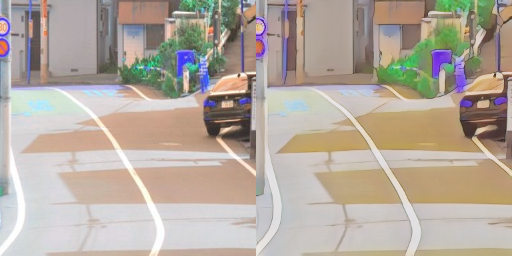

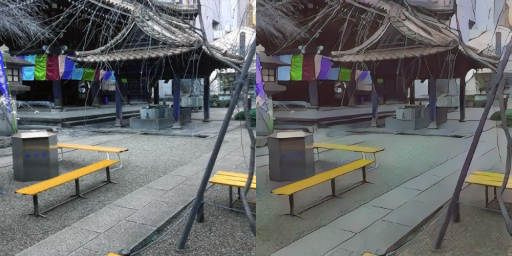

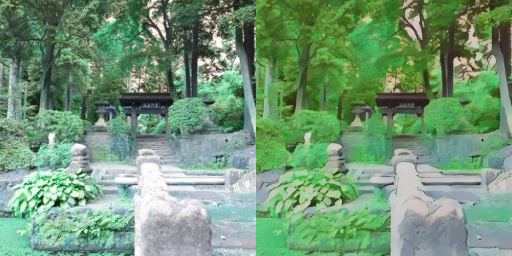

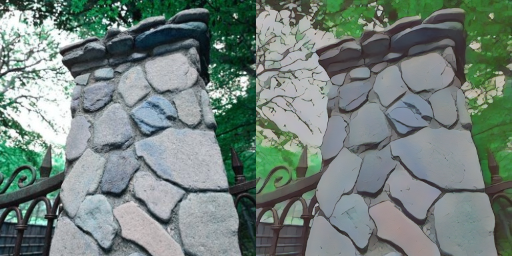

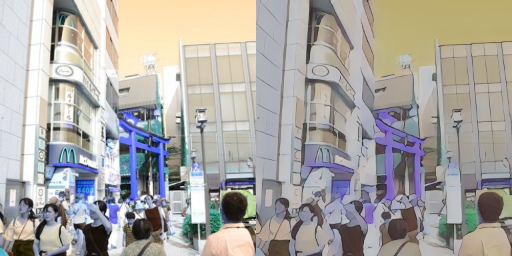

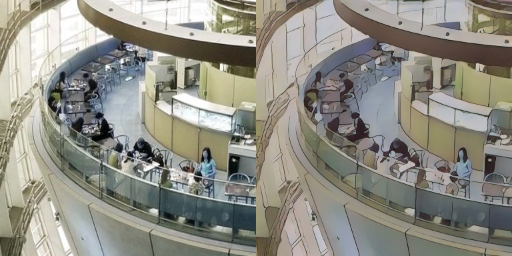

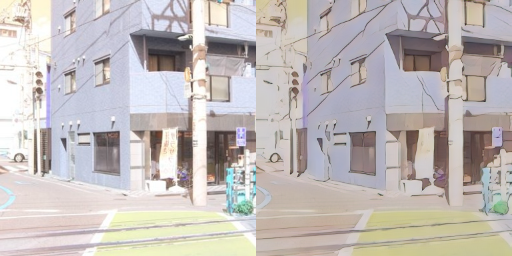

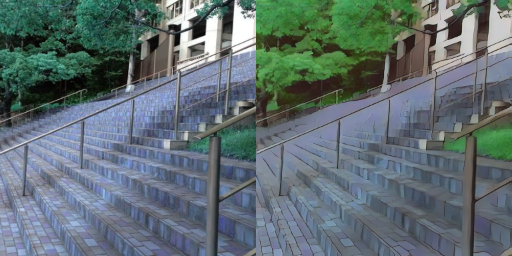

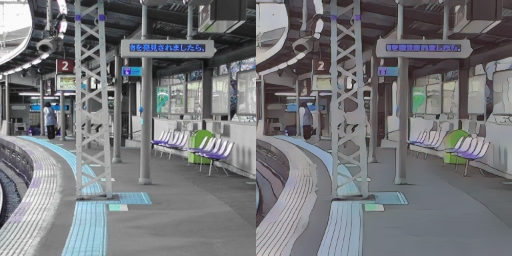

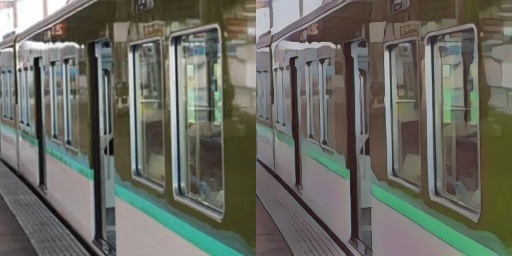

Results for AnimeGANv2_Hayao


  0%|          | 0/10 [00:00<?, ?it/s]

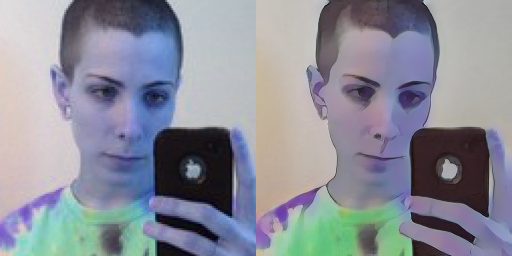

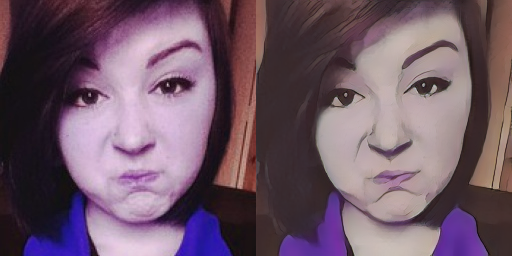

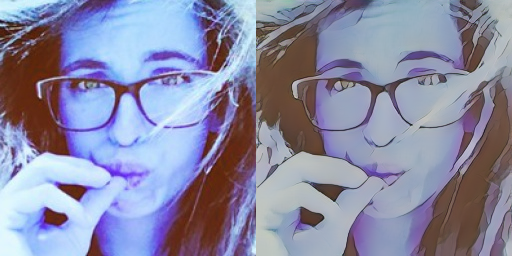

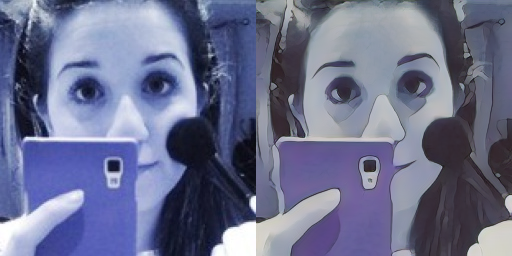

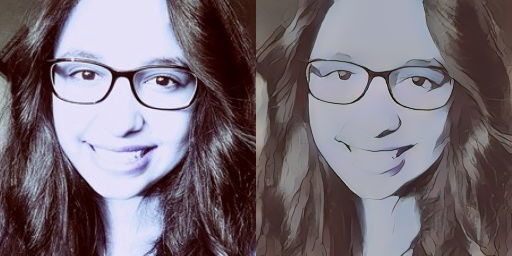

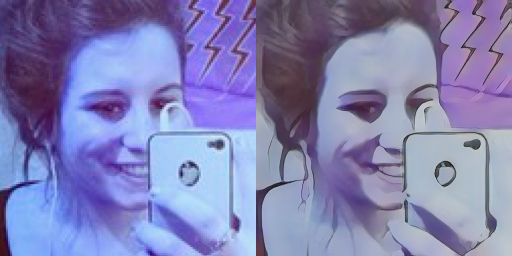

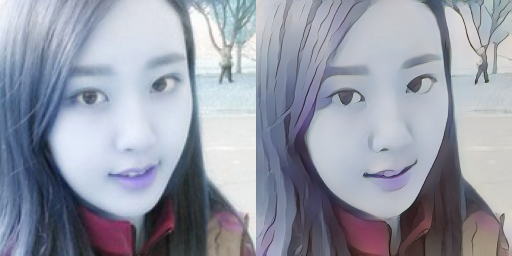

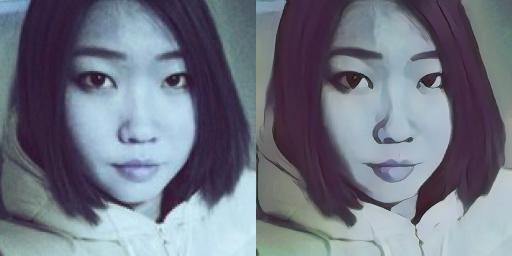

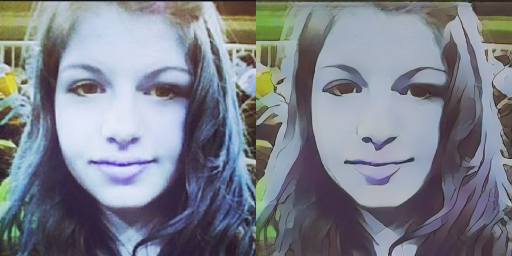

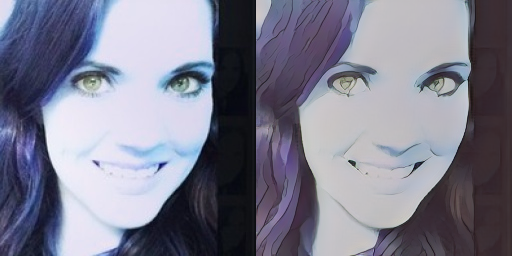

Results for AnimeGANv2_Paprika


  0%|          | 0/10 [00:00<?, ?it/s]

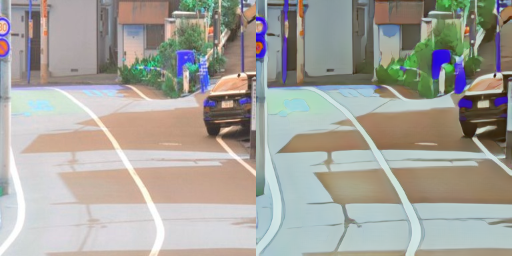

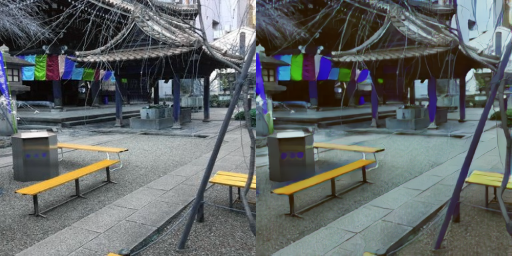

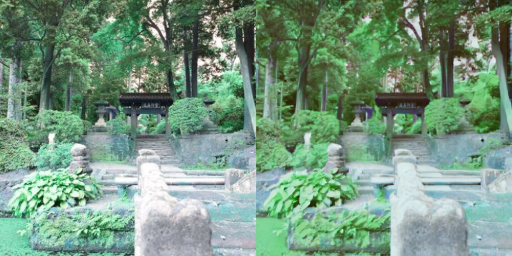

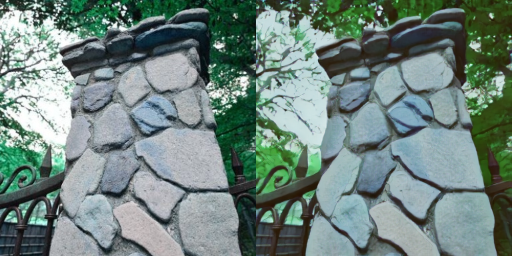

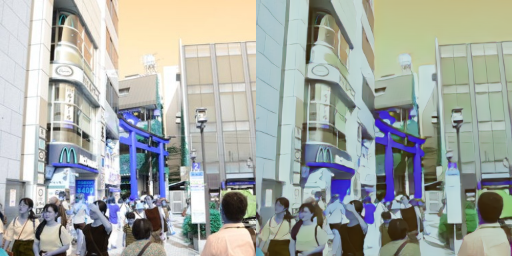

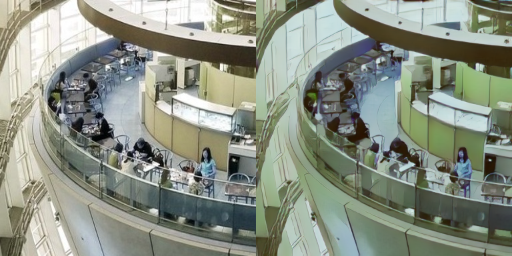

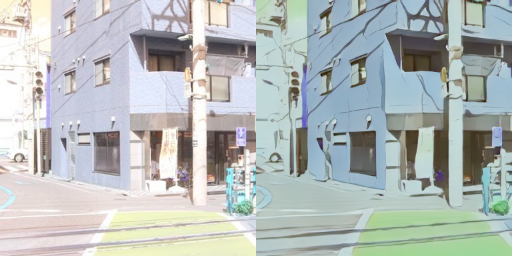

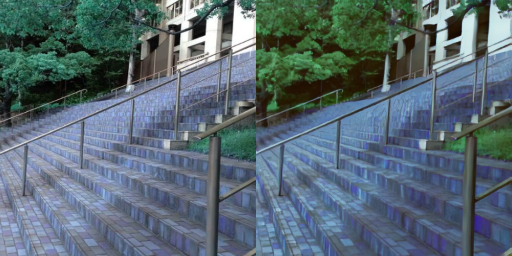

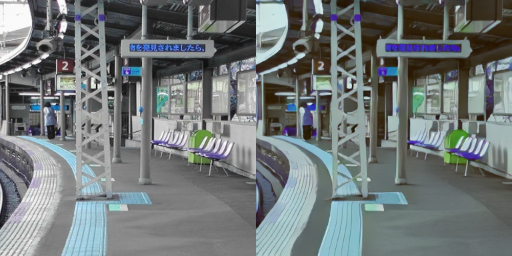

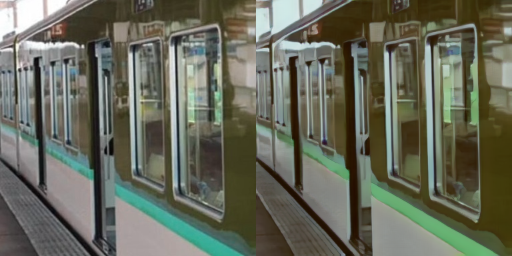

Results for AnimeGANv2_Paprika


  0%|          | 0/10 [00:00<?, ?it/s]

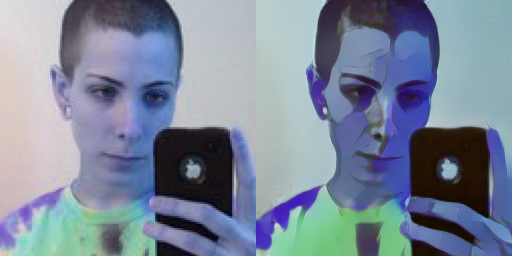

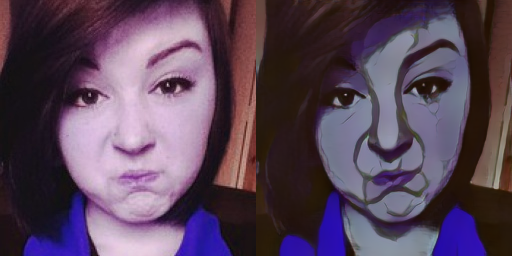

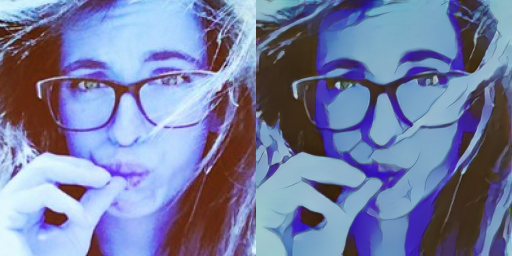

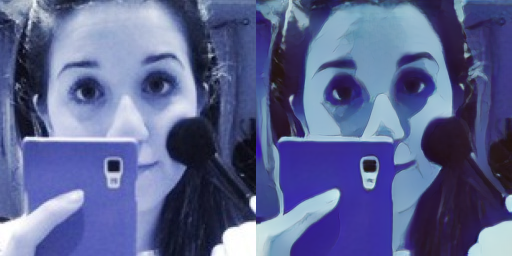

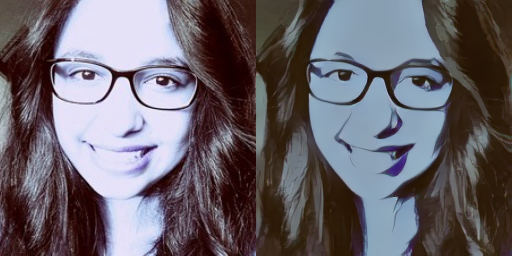

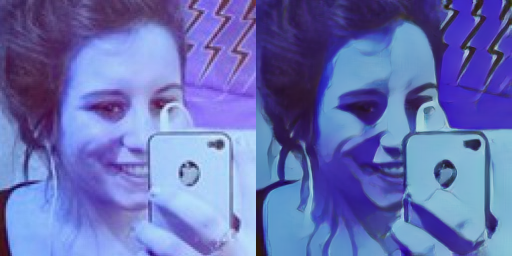

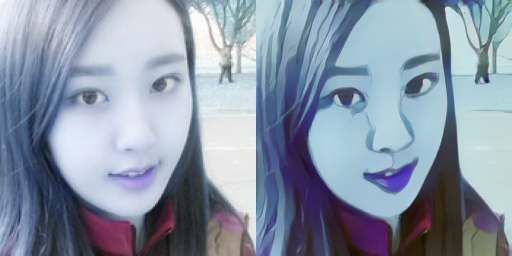

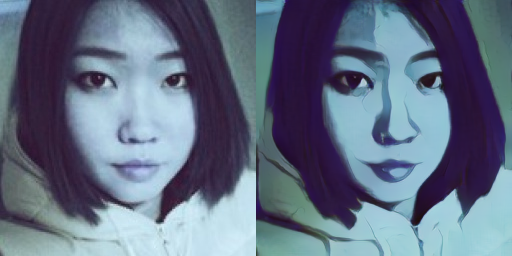

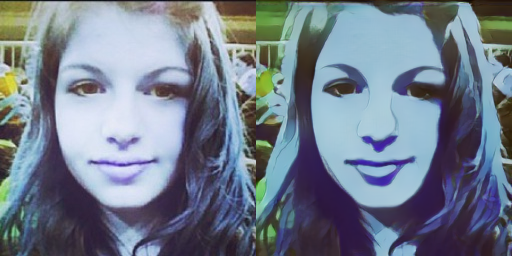

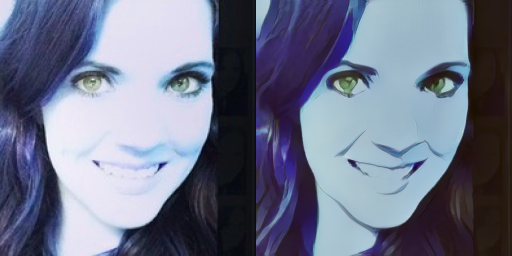

Results for AnimeGANv2_Shinkai


  0%|          | 0/10 [00:00<?, ?it/s]

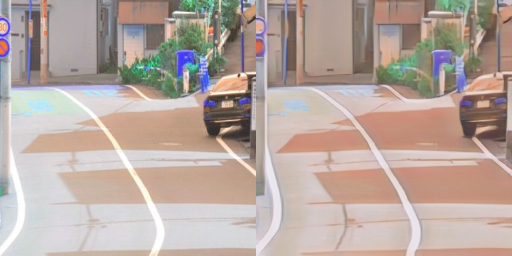

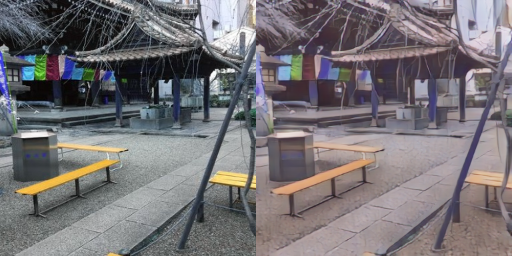

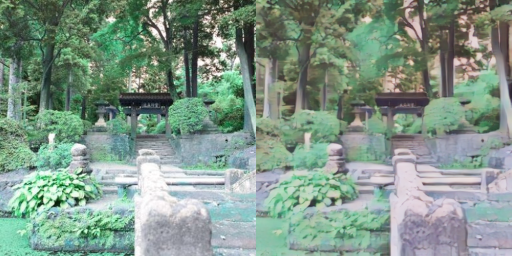

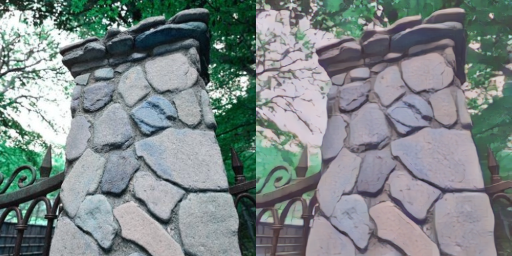

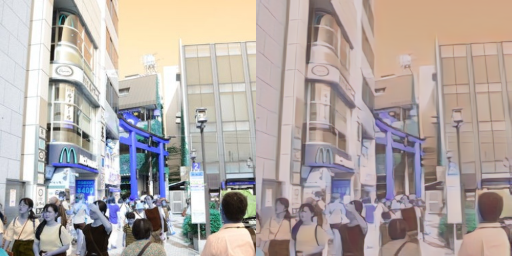

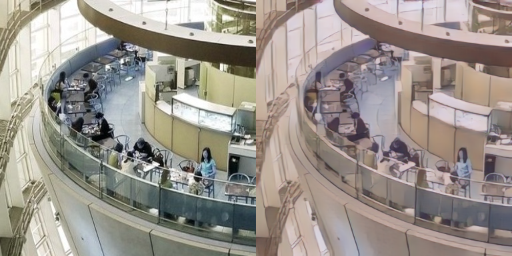

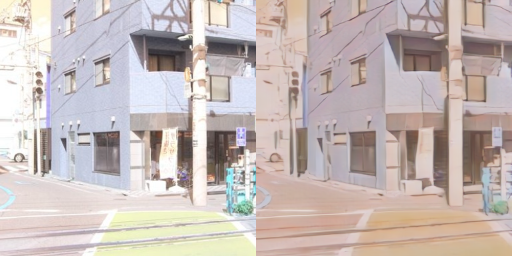

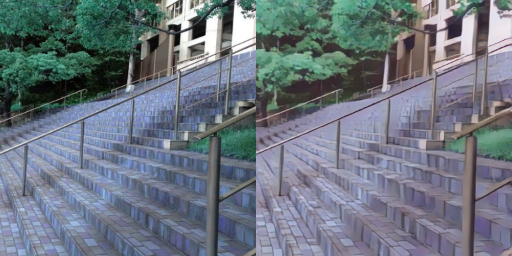

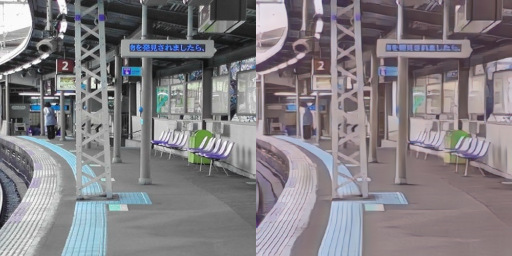

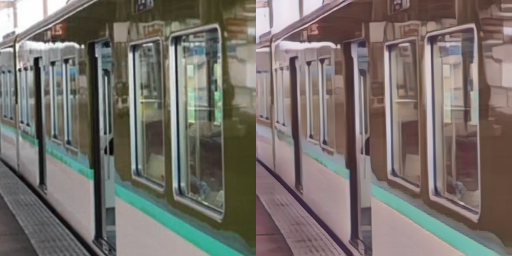

Results for AnimeGANv2_Shinkai


  0%|          | 0/10 [00:00<?, ?it/s]

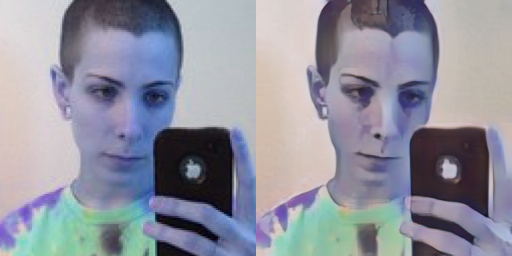

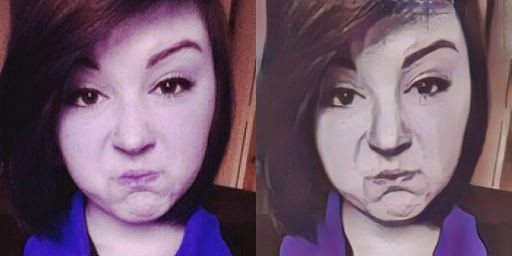

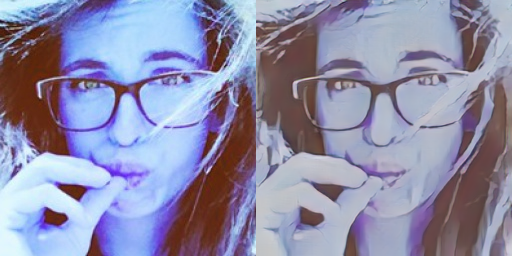

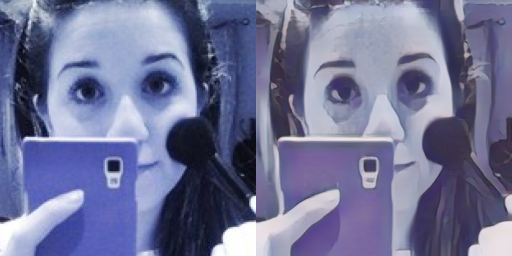

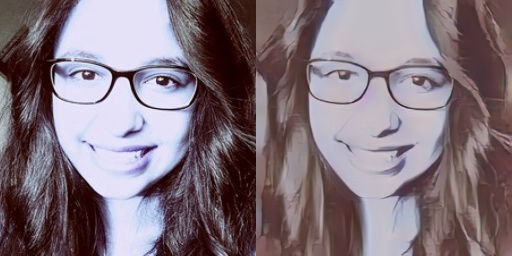

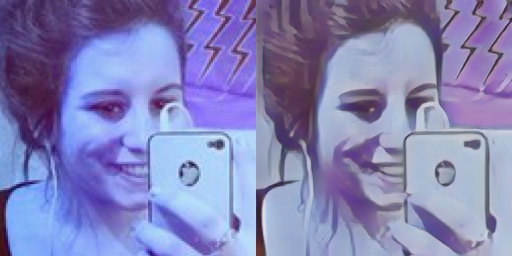

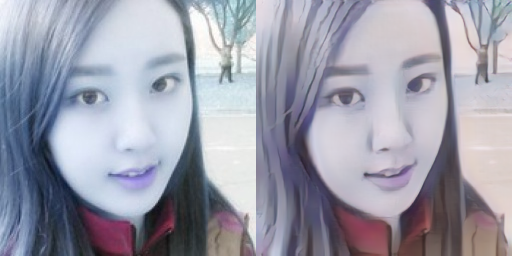

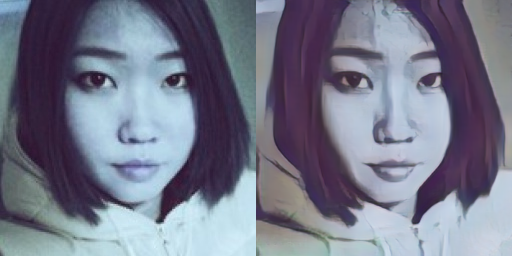

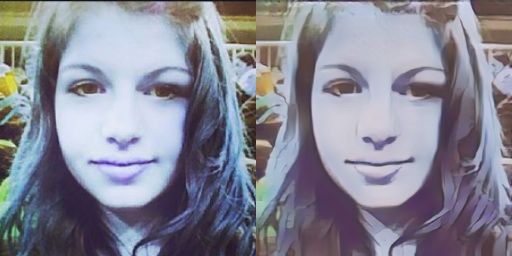

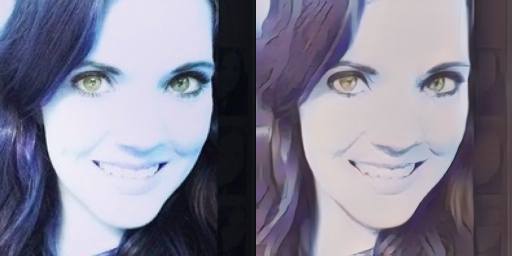

In [ ]:
# Process and display images for each model and dataset
for model_name, model_session in models.items():
    process_and_display_images(image_dir_animegan, model_session, model_name)
    process_and_display_images(image_dir_selfie2anime, model_session, model_name)